# Hierarchical and Density-based Clustering

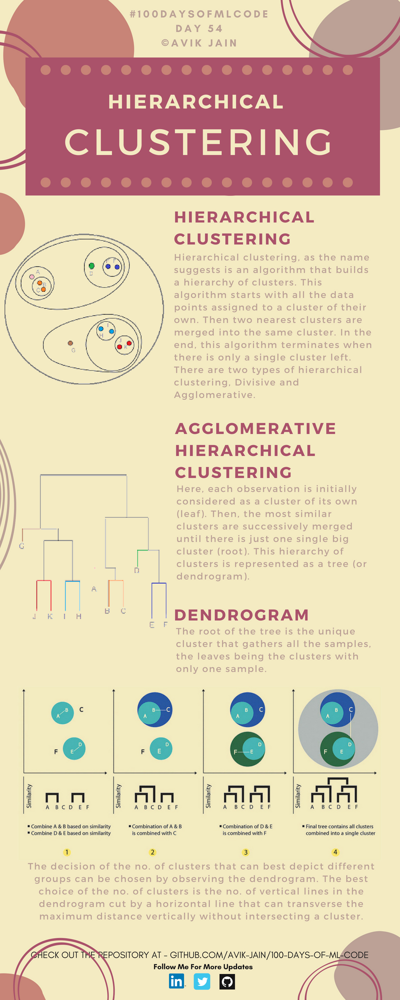

# 1. K - Means Clustering

- Looking at cases where k-means would/ would not be able to carve out the correct clusters.
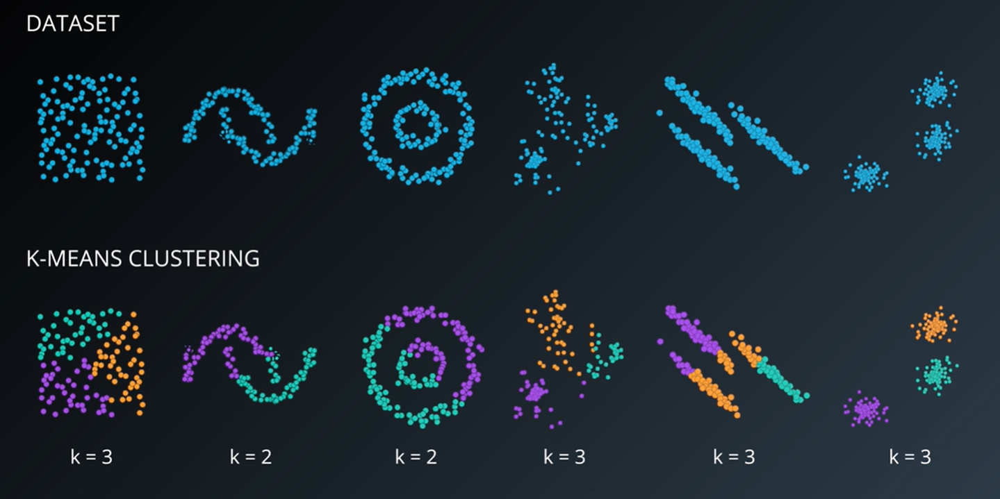

1. For Uniform type distribution dataset, k-means clustering seems plausible
2. For two-crescent dataset, k-means would not be able to carve out the correct clusters.
3. For two rings dataset, k-means would be not able to find clusters in those shapes
4. k-means does reasonable job in carving them out
5. k-means would be not able to find clusters in those shapes
6. k-means does reasonable job in carving them out

# 2. Hierarchical Clustering

### 1. Agglomerative Approach (bottom-up)
#### Initialization:
 - Each object is a cluster
 
#### Iteration:
 - Merge two clusters which are most similar to each other;
 - Until all objects are merged into a single cluster
 
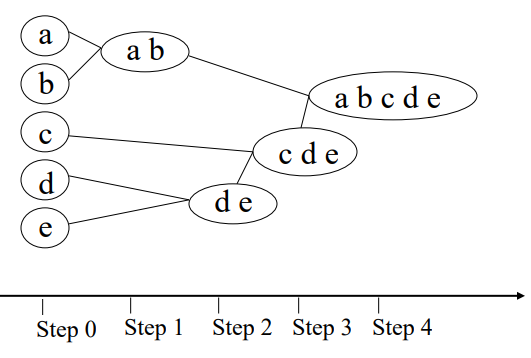

### 2. Divisive Approach (top-down)
#### Initialization:
 - All objects stay in one cluster
 
#### Iteration:
 - Select a cluster and split it into two sub clusters
 - Until each leaf cluster contains only one object
 
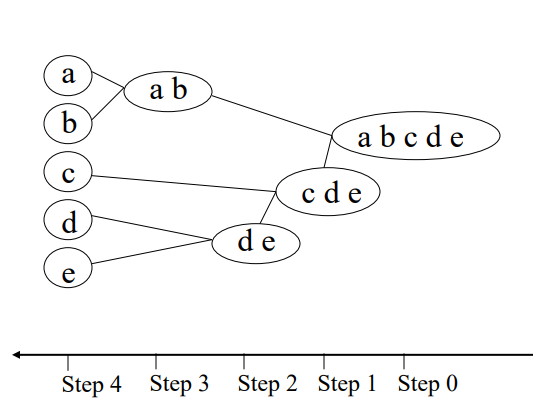

### What is Dendrogram?
- A tree that shows how clusters are merged/split hierarchically
- Each node on the tree is a cluster; each leaf node is a singleton cluster
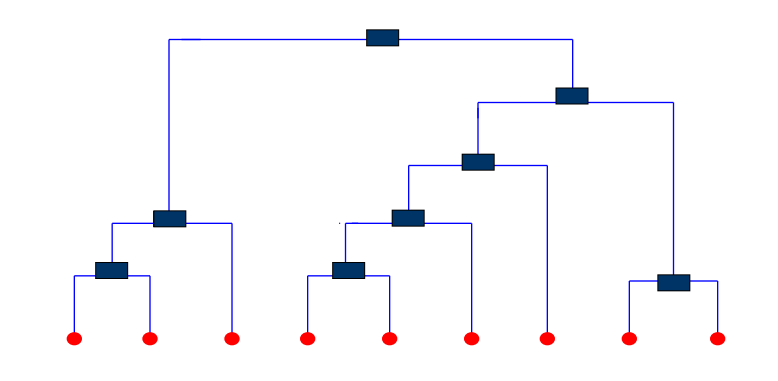

- A clustering of the data objects is obtained by cutting the dendrogram at the desired level, then each connected component forms a cluster
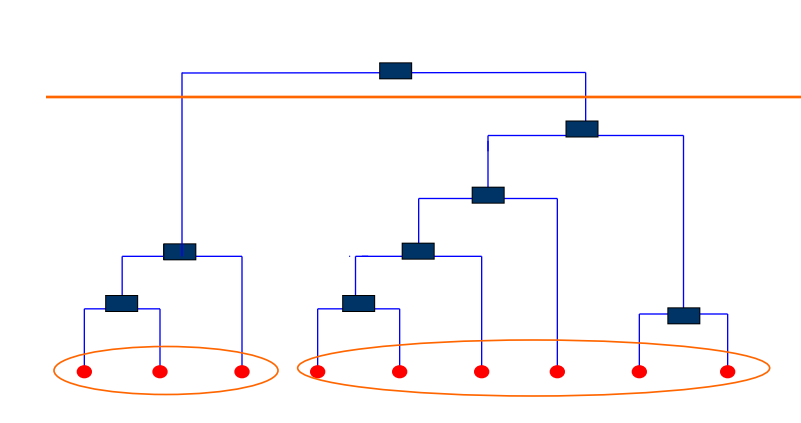

### How Agglomerative Clustering Algorithm works?
1. Compute the distance matrix
2. Let each data point be a cluster
3. Repeat
4. Merge the two closest clusters
5. Update the distance matrix
6. Until only a single cluster remains

### Key operation is the computation of the distance between two clusters
– Different approaches to defining the distance between clusters distinguish the different algorithms

### How to Define Inter-Cluster Distance
- Min or Single Link
- MAX or Complete Link
- Group Average or Average Link
- Distance Between Centroids or Centroid Distance or Ward's Method

## A. Single Link Clustering
- The distance between two clusters is represented by the distance of the closest pair of data objects belonging to different clusters

### Step 0: Suppose we have two features and we would want to cluster them.
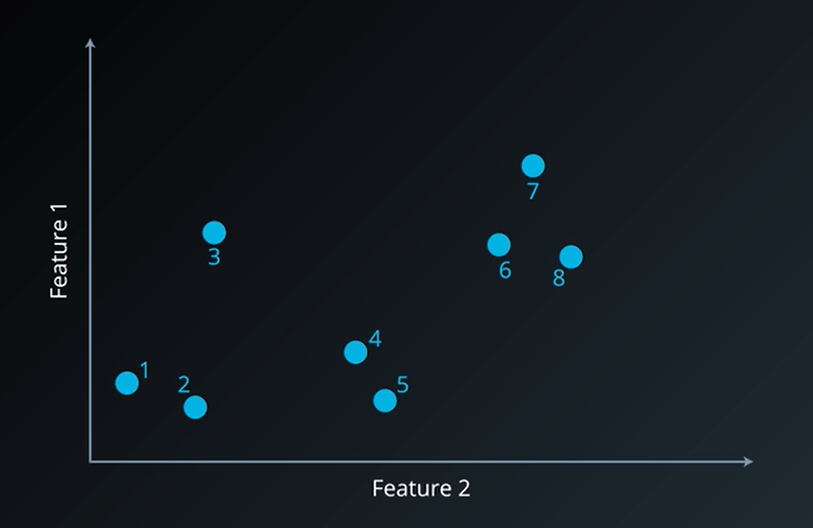

### Step 1: Assume each point is a cluster
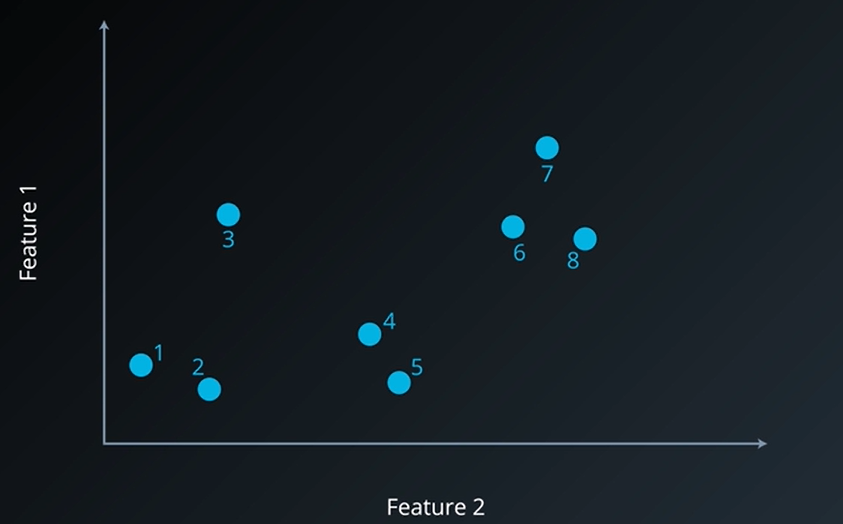

### Step 2: Calculate the distance between each point and each other points, and then we choose the smallest distance between two clusters, and we group those two points into  a cluster
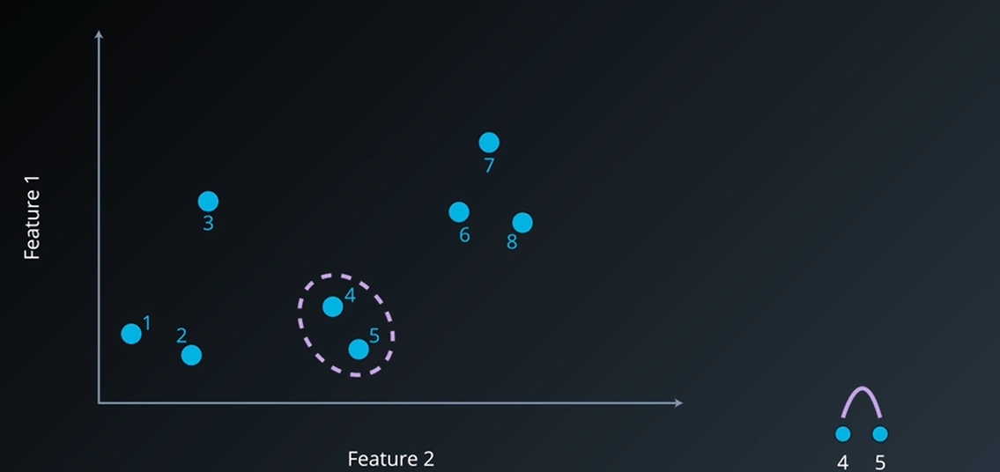

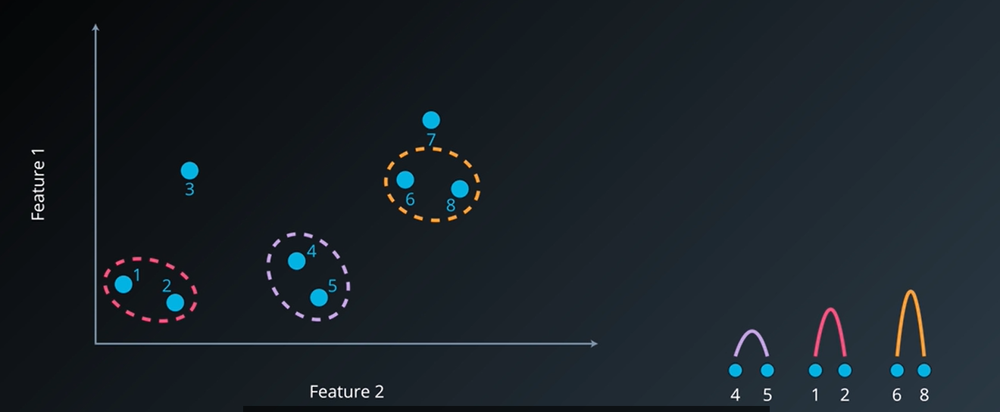

### Step 3: Now, the question is, what is the distance between the orange cluster and point number 7. That depends on the type of hierarchical clustering method you're using. Single Link looks at the closest point in the cluster, and so the distance between these two clusters is the distance between seven and six which is the closest point to it.
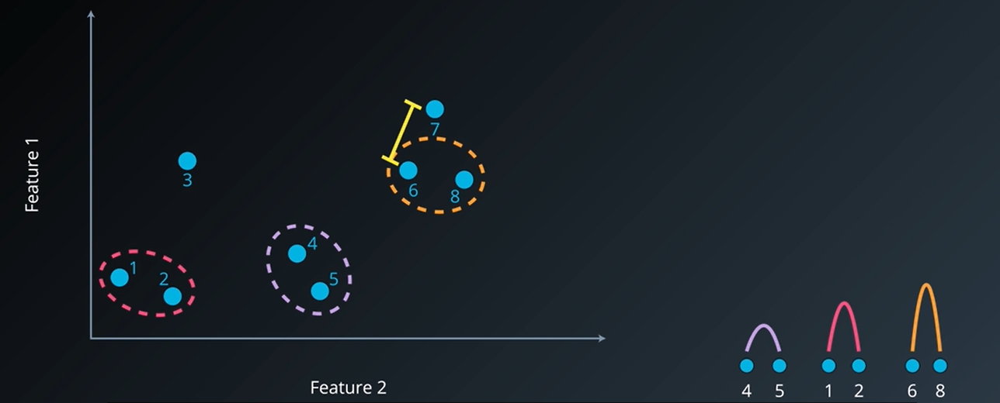

### Step 4: If we continue to add the clusters together, we can have a tree that encompasses the entire data points
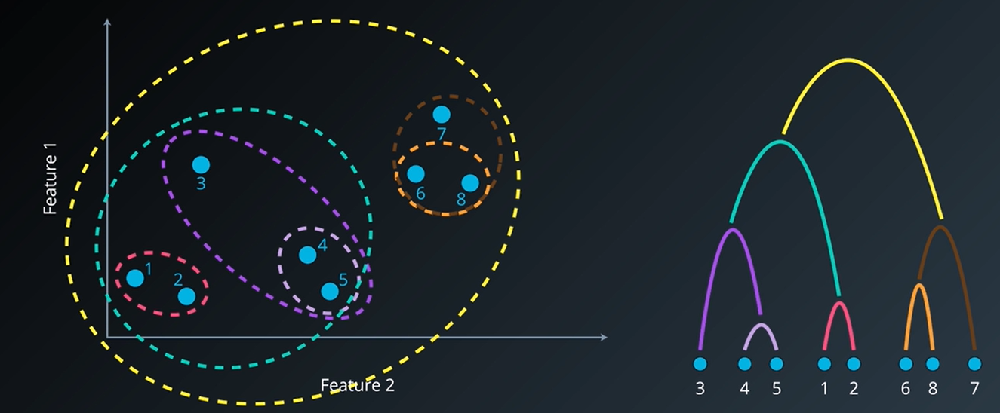

### Note: The input that we need to give to single link, is how many clusters we are looking for?
##### If we want two clusters, we can cut the tree like below
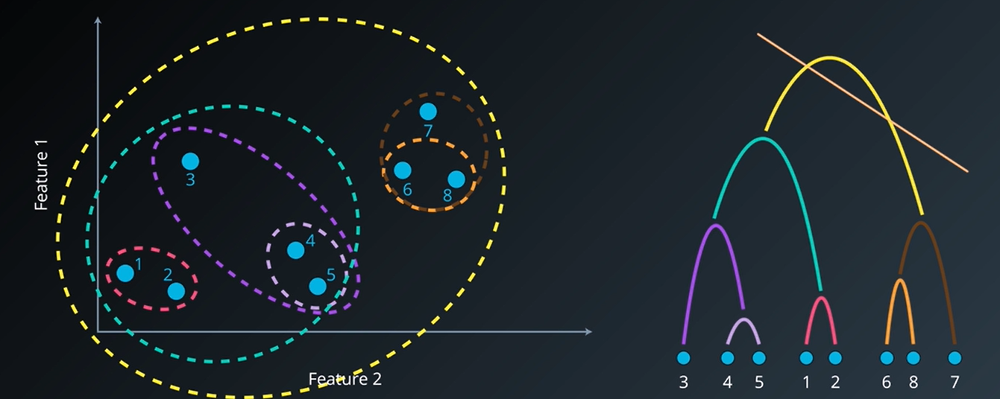

##### If we want three clusters, we can cut the tree like below
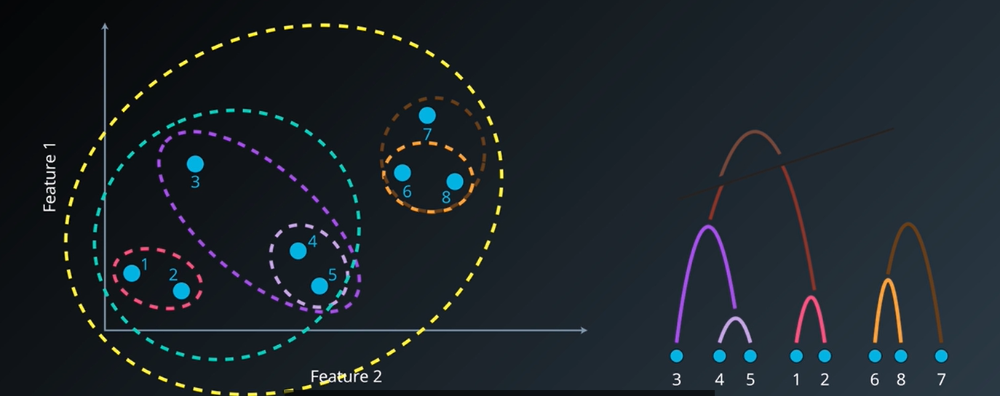

### Problem with Single Link
- Can produce elongated clusters
- It is not there in scikit learn

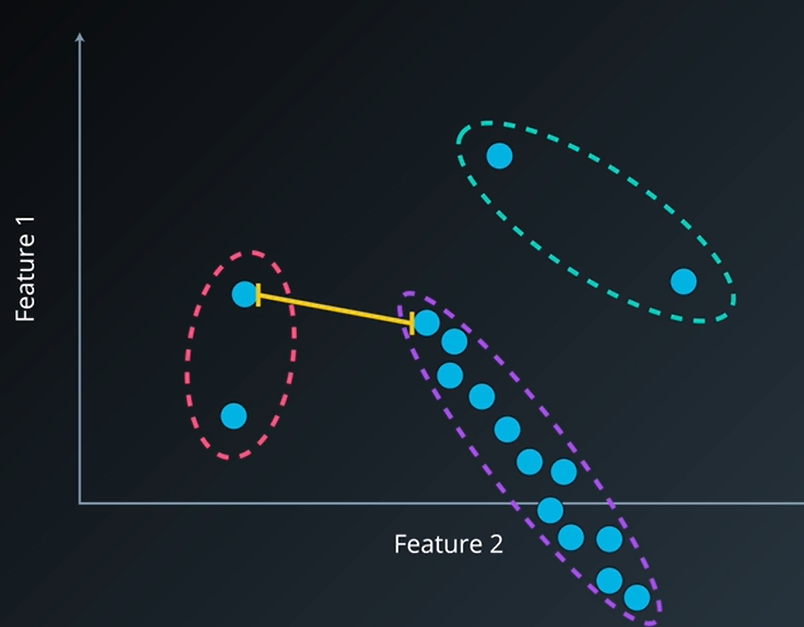

### Examining Single Link Clustering and comparing it with k-means clustering
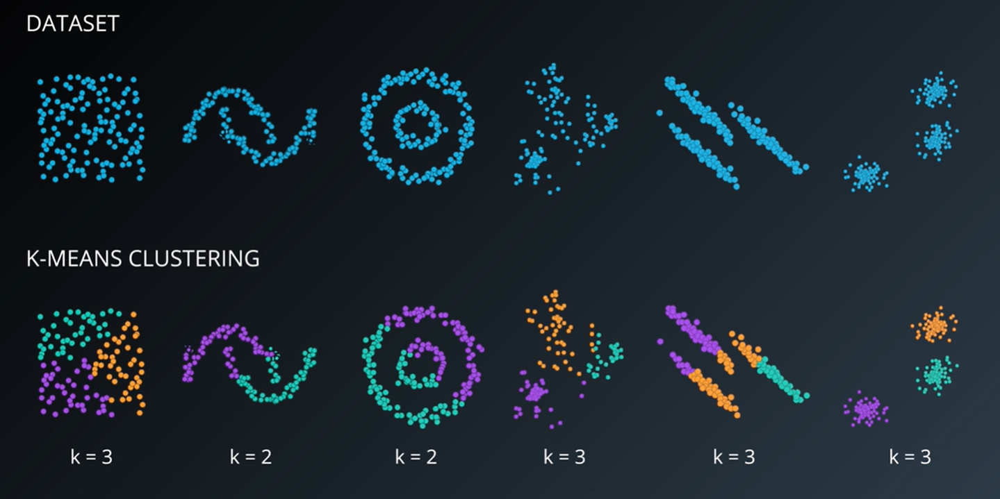

### Examining Single Link Clustering and its associated dendograms
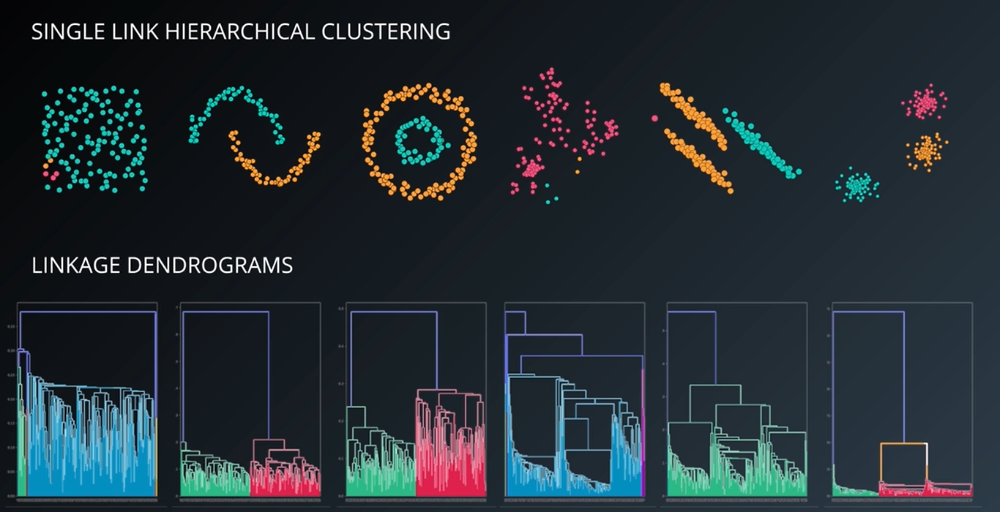

## B. Complete Link Clustering
- The distance between two clusters is represented by the distance of the farthest pair of data objects belonging to different clusters

### Step 0: Suppose we have two features and we would want to cluster them.
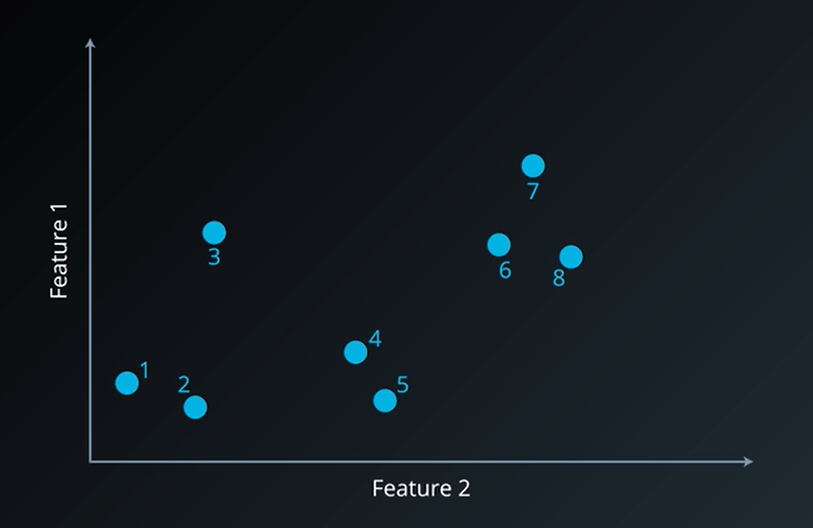

### Step 1: Assume each point is a cluster
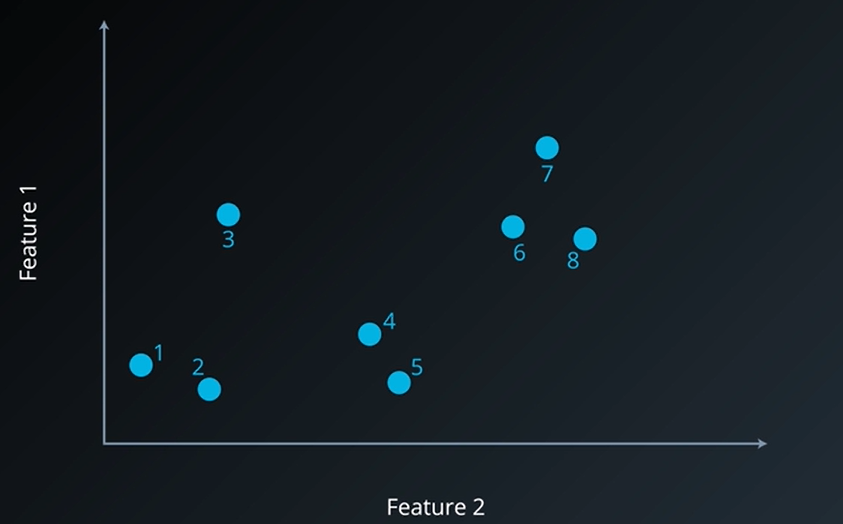

### Step 2: Calculate the distance between each point and each other points, and then we choose the smallest distance between two clusters, and we group those two points into  a cluster
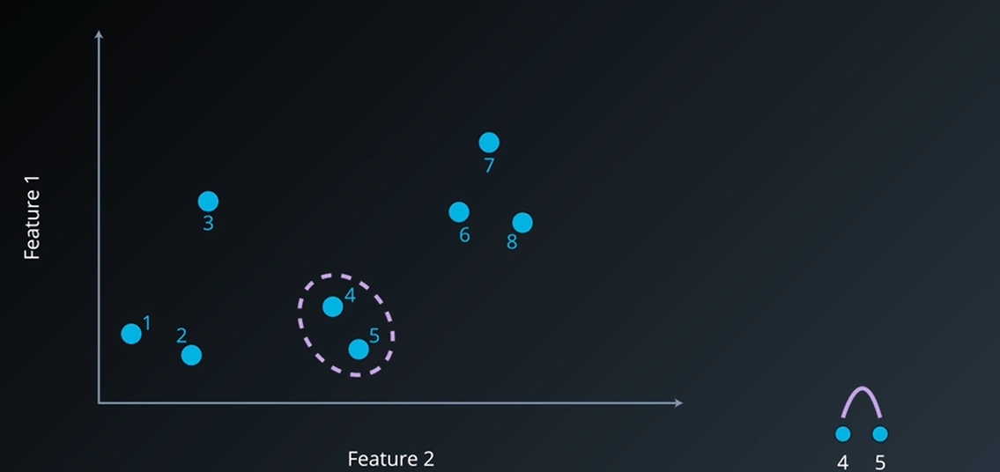

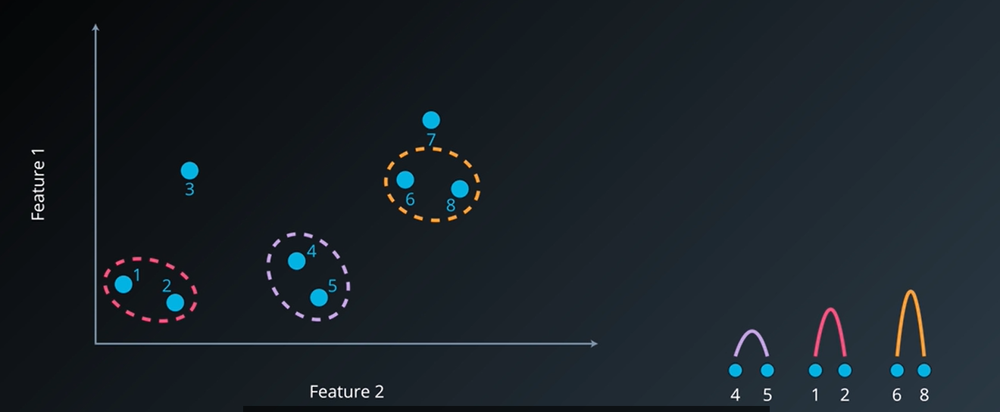

### Step 3: Now, the question is, what is the distance between the orange cluster and point number 7. That depends on the type of hierarchical clustering method you're using. Complete Link looks at the farthest two points in the two clusters and that is the distance between two clusters.
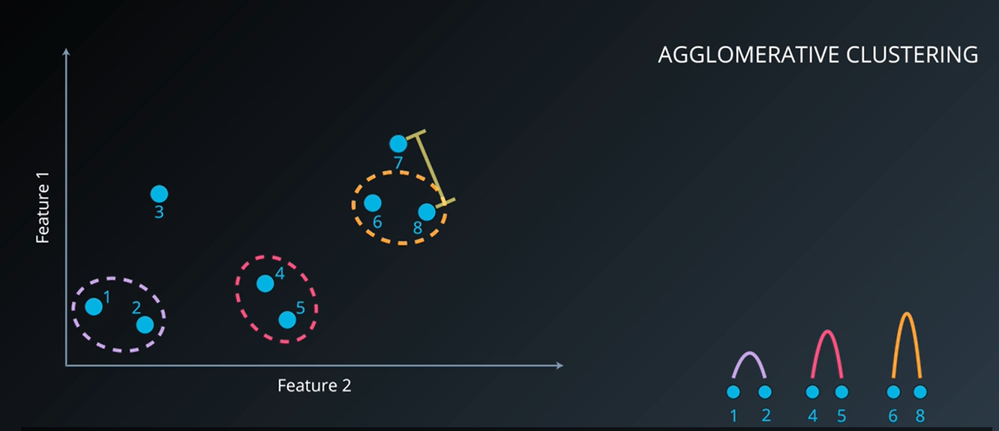

### Step 4: If we continue to add the clusters together, we can have a tree that encompasses the entire data points
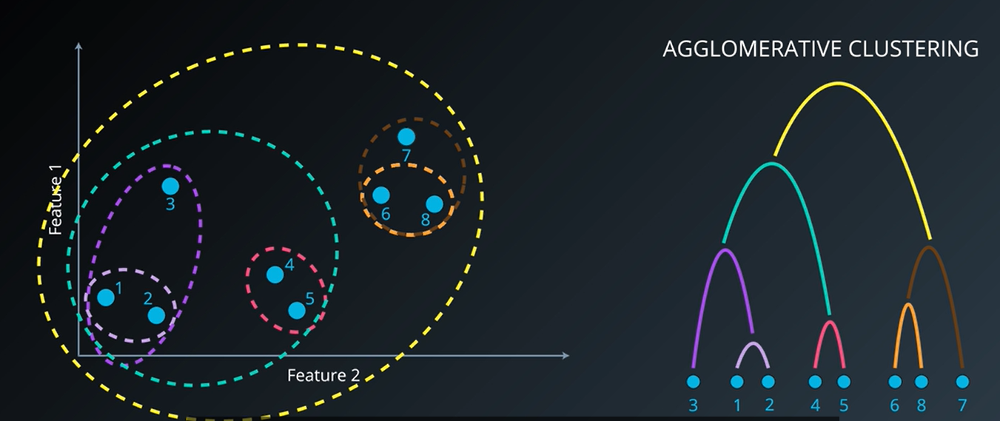

### Note: The input that we need to give to complete link, is how many clusters we are looking for?
##### If we want two clusters, we can cut the tree like below
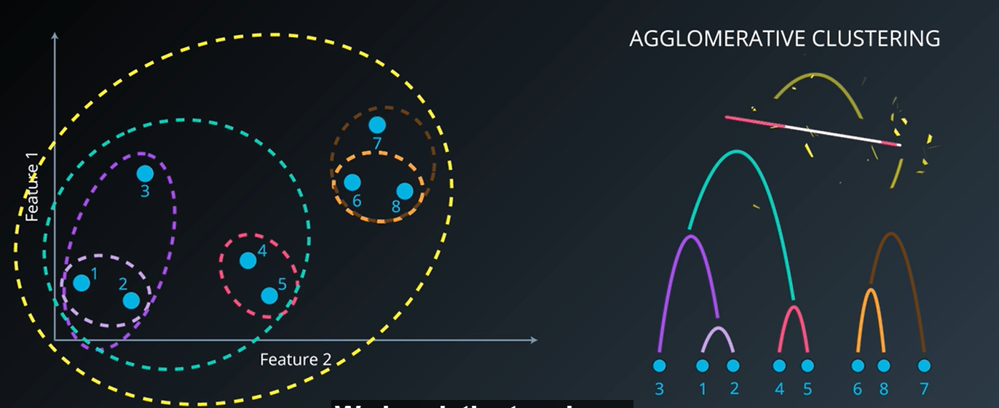

### Benefit of Complete Link
- Can produce compact clusters

## C. Average Link Clustering
- The distance between two clusters is represented by the average distance of all pairs of data objects belonging to different clusters
- It looks at the distance between every point and every other pointin the other cluster, and the average of all these distances is the distance between the two clusters

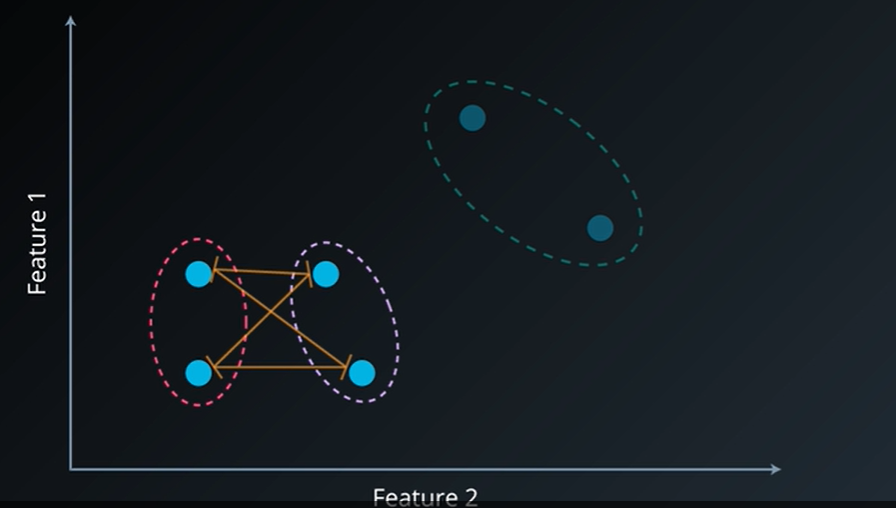

## D. Ward's Method
- This is the default method in scikit learn for hierarchical clustering and it's the method that tries to minimize variance when merging two clusters.

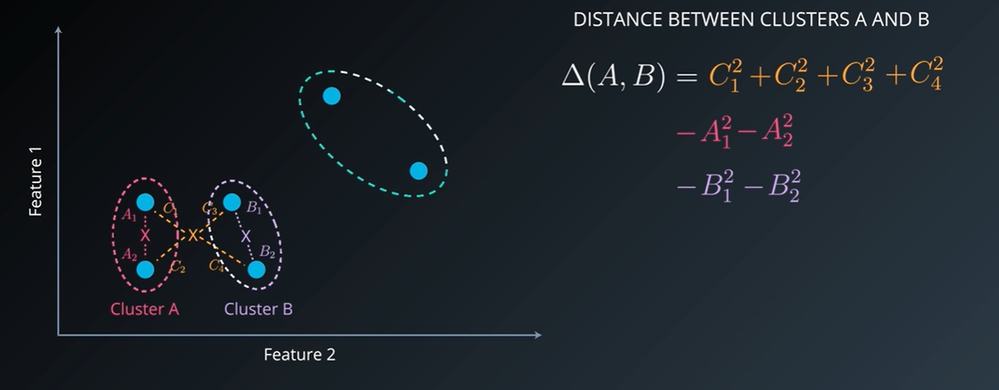

# 3. Hierarchical Clustering Implementation

In [1]:
from sklearn import datasets, cluster

In [2]:
# Load dataset
X = datasets.load_iris().data[:10]

In [3]:
# Specify the parameters for the clustering. 'ward' linkage is default
# Can also use 'complete' or 'average'
clust = cluster.AgglomerativeClustering(n_clusters = 3, linkage = 'ward')
labels = clust.fit_predict(X)
labels

array([1, 0, 0, 0, 1, 2, 0, 1, 0, 0], dtype=int64)

In [4]:
# 'labels' now contains an array representing which cluster each point belongs to
# [1 0 0 0 1 2 0 1 0 0]

In [5]:
from scipy.cluster.hierarchy import dendrogram, ward, single
from sklearn import datasets
import matplotlib.pyplot as plt

In [6]:
# Load dataset
X = datasets.load_iris().data[:10]

In [7]:
# Perform clustering
linkage_matrix = ward(X)

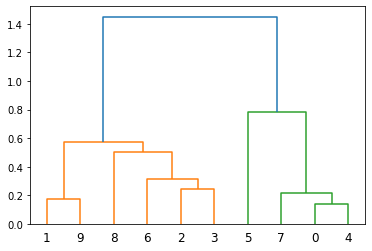

In [8]:
# Plot dendogram
dendrogram(linkage_matrix)
plt.show()

# 4. Hierarchical Clustering Project

- In this notebook, we will be using sklearn to conduct hierarchical clustering on the [Iris dataset](https://archive.ics.uci.edu/ml/datasets/iris) which contains 4 dimensions/attributes and 150 samples. Each sample is labeled as one of the three type of Iris flowers.

- In this exercise, we'll ignore the labeling and cluster based on the attributes, then we'll compare the results of different hierarchical clustering techniques with the original labels to see which one does a better job in this scenario. We'll then proceed to visualize the resulting cluster hierarchies.

#### 1. Importing the Iris dataset

In [9]:
from sklearn import datasets
iris = datasets.load_iris()

In [10]:
# A look at the first 10 samples in the dataset
iris.data[:10]

array([[5.1, 3.5, 1.4, 0.2],
       [4.9, 3. , 1.4, 0.2],
       [4.7, 3.2, 1.3, 0.2],
       [4.6, 3.1, 1.5, 0.2],
       [5. , 3.6, 1.4, 0.2],
       [5.4, 3.9, 1.7, 0.4],
       [4.6, 3.4, 1.4, 0.3],
       [5. , 3.4, 1.5, 0.2],
       [4.4, 2.9, 1.4, 0.2],
       [4.9, 3.1, 1.5, 0.1]])

In [11]:
# iris.target contains the labels that indicate which type of Iris flower each sample is
iris.target

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

#### 2. Clustering
Let's now use sklearn's ```AgglomerativeClustering``` to conduct the heirarchical clustering

In [12]:
from sklearn.cluster import AgglomerativeClustering

In [13]:
# Hierarchical clustering using default
# Ward is the default linkage algorithm, so we'll start with that
ward = AgglomerativeClustering(n_clusters=3)
ward_pred = ward.fit_predict(iris.data)

In [14]:
# Hierarchical clustering using complete linkage
# Create an instance of AgglomerativeClustering with the appropriate parameters
complete = AgglomerativeClustering(n_clusters=3, linkage="complete")
# Fit & predict
# Make AgglomerativeClustering fit the dataset and predict the cluster labels
complete_pred = complete.fit_predict(iris.data)

In [15]:
# Hierarchical clustering using average linkage
# Create an instance of AgglomerativeClustering with the appropriate parameters
avg = AgglomerativeClustering(n_clusters=3, linkage="average")
# Fit & predict
# Make AgglomerativeClustering fit the dataset and predict the cluster labels
avg_pred = avg.fit_predict(iris.data)

- To determine which clustering result better matches the original labels of the samples, we can use ```adjusted_rand_score``` which is an *external cluster validation index* which results in a score between -1 and 1, where 1 means two clusterings are identical of how they grouped the samples in a dataset (regardless of what label is assigned to each cluster).

- Cluster validation indices are discussed later in the course.

In [16]:
from sklearn.metrics import adjusted_rand_score

ward_ar_score = adjusted_rand_score(iris.target, ward_pred)
ward_ar_score

0.7311985567707745

In [17]:
# Calculated the adjusted Rand score for the complete linkage clustering labels
complete_ar_score = adjusted_rand_score(iris.target, complete_pred)
complete_ar_score

0.64225125183629

In [18]:
# Calculated the adjusted Rand score for the average linkage clustering labels
avg_ar_score = adjusted_rand_score(iris.target, avg_pred)
avg_ar_score

0.7591987071071522

In [19]:
# Which algorithm results in the higher Adjusted Rand Score?
print( "Scores: \nWard:", ward_ar_score,"\nComplete: ", complete_ar_score, "\nAverage: ", avg_ar_score)

Scores: 
Ward: 0.7311985567707745 
Complete:  0.64225125183629 
Average:  0.7591987071071522


#### 3. The Effect of Normalization on Clustering

Can we improve on this clustering result?

Let's take another look at the dataset

In [20]:
iris.data[:15]

array([[5.1, 3.5, 1.4, 0.2],
       [4.9, 3. , 1.4, 0.2],
       [4.7, 3.2, 1.3, 0.2],
       [4.6, 3.1, 1.5, 0.2],
       [5. , 3.6, 1.4, 0.2],
       [5.4, 3.9, 1.7, 0.4],
       [4.6, 3.4, 1.4, 0.3],
       [5. , 3.4, 1.5, 0.2],
       [4.4, 2.9, 1.4, 0.2],
       [4.9, 3.1, 1.5, 0.1],
       [5.4, 3.7, 1.5, 0.2],
       [4.8, 3.4, 1.6, 0.2],
       [4.8, 3. , 1.4, 0.1],
       [4.3, 3. , 1.1, 0.1],
       [5.8, 4. , 1.2, 0.2]])

- Looking at this, we can see that the forth column has smaller values than the rest of the columns, and so its variance counts for less in the clustering process (since clustering is based on distance). Let us [normalize](https://en.wikipedia.org/wiki/Feature_scaling) the dataset so that each dimension lies between 0 and 1, so they have equal weight in the clustering process.

- This is done by subtracting the minimum from each column then dividing the difference by the range.

- sklearn provides us with a useful utility called ```preprocessing.normalize()``` that can do that for us

In [21]:
from sklearn import preprocessing

normalized_X = preprocessing.normalize(iris.data)
normalized_X[:10]

array([[0.80377277, 0.55160877, 0.22064351, 0.0315205 ],
       [0.82813287, 0.50702013, 0.23660939, 0.03380134],
       [0.80533308, 0.54831188, 0.2227517 , 0.03426949],
       [0.80003025, 0.53915082, 0.26087943, 0.03478392],
       [0.790965  , 0.5694948 , 0.2214702 , 0.0316386 ],
       [0.78417499, 0.5663486 , 0.2468699 , 0.05808704],
       [0.78010936, 0.57660257, 0.23742459, 0.0508767 ],
       [0.80218492, 0.54548574, 0.24065548, 0.0320874 ],
       [0.80642366, 0.5315065 , 0.25658935, 0.03665562],
       [0.81803119, 0.51752994, 0.25041771, 0.01669451]])

- Now all the columns are in the range between 0 and 1. Would clustering the dataset after this transformation lead to a better clustering? (one that better matches the original labels of the samples)

In [22]:
ward = AgglomerativeClustering(n_clusters=3)
ward_pred = ward.fit_predict(normalized_X)
ward_pred

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 0,
       2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2], dtype=int64)

In [23]:
complete = AgglomerativeClustering(n_clusters=3, linkage="complete")
complete_pred = complete.fit_predict(normalized_X)
complete_pred

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2,
       1, 1, 1, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 2, 1, 2, 1,
       2, 1, 2, 1, 2, 1, 1, 1, 2, 1, 2, 2, 2, 1, 1, 1, 2, 1], dtype=int64)

In [24]:
avg = AgglomerativeClustering(n_clusters=3, linkage="average")
avg_pred = avg.fit_predict(normalized_X)
avg_pred

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int64)

In [25]:
ward_ar_score = adjusted_rand_score(iris.target, ward_pred)
complete_ar_score = adjusted_rand_score(iris.target, complete_pred)
avg_ar_score = adjusted_rand_score(iris.target, avg_pred)

print( "Scores: \nWard:", ward_ar_score,"\nComplete: ", complete_ar_score, "\nAverage: ", avg_ar_score)

Scores: 
Ward: 0.8856970310281228 
Complete:  0.644447235392006 
Average:  0.5583714437541352


#### 4. Dendrogram visualization with scipy

- Let's visualize the highest scoring clustering result. 

- To do that, we'll need to use Scipy's [```linkage```](https://docs.scipy.org/doc/scipy/reference/generated/scipy.cluster.hierarchy.linkage.html) function to perform the clusteirng again so we can obtain the linkage matrix it will later use to visualize the hierarchy

In [26]:
# Import scipy's linkage function to conduct the clustering
from scipy.cluster.hierarchy import linkage

# Specify the linkage type. Scipy accepts 'ward', 'complete', 'average', as well as other values
# Pick the one that resulted in the highest Adjusted Rand Score
linkage_type = 'ward'

linkage_matrix = linkage(normalized_X, linkage_type)

Plot using scipy's [dendrogram](https://docs.scipy.org/doc/scipy-0.14.0/reference/generated/scipy.cluster.hierarchy.dendrogram.html) function

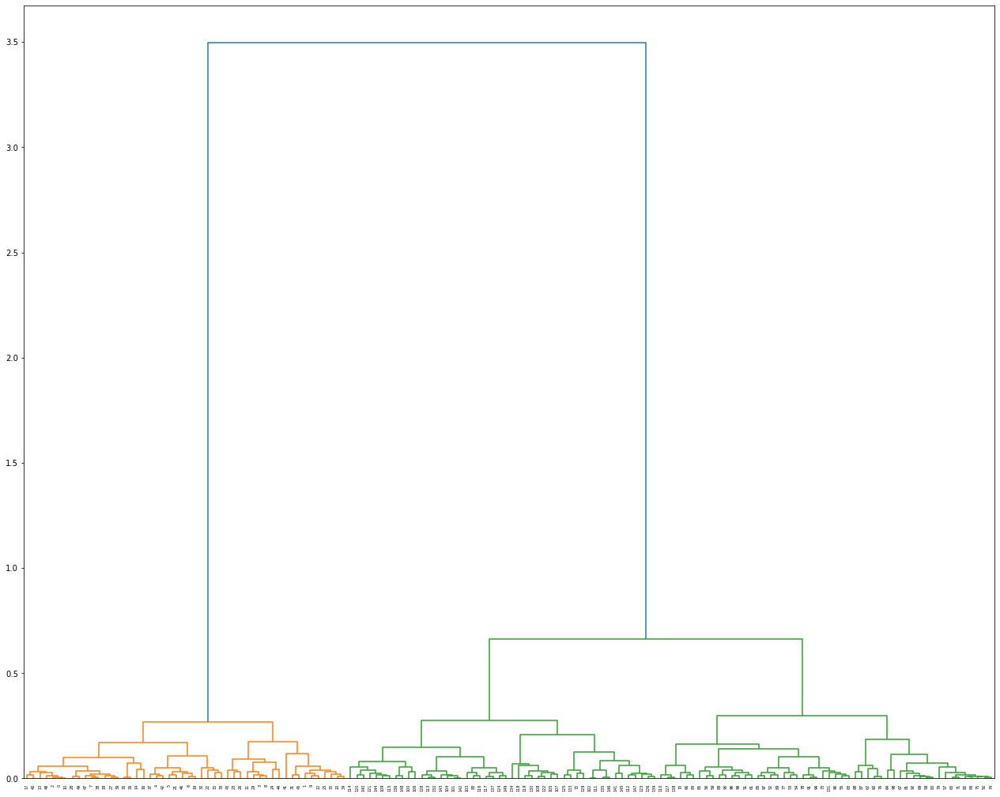

In [27]:
from scipy.cluster.hierarchy import dendrogram
import matplotlib.pyplot as plt
plt.figure(figsize=(22,18))

# plot using 'dendrogram()'
dendrogram(linkage_matrix)

plt.show()

#### 5. Visualization with Seaborn's ```clustermap``` 

The [seaborn](http://seaborn.pydata.org/index.html) plotting library for python can plot a [clustermap](http://seaborn.pydata.org/generated/seaborn.clustermap.html), which is a detailed dendrogram which also visualizes the dataset in more detail. It conducts the clustering as well, so we only need to pass it the dataset and the linkage type we want, and it will use scipy internally to conduct the clustering

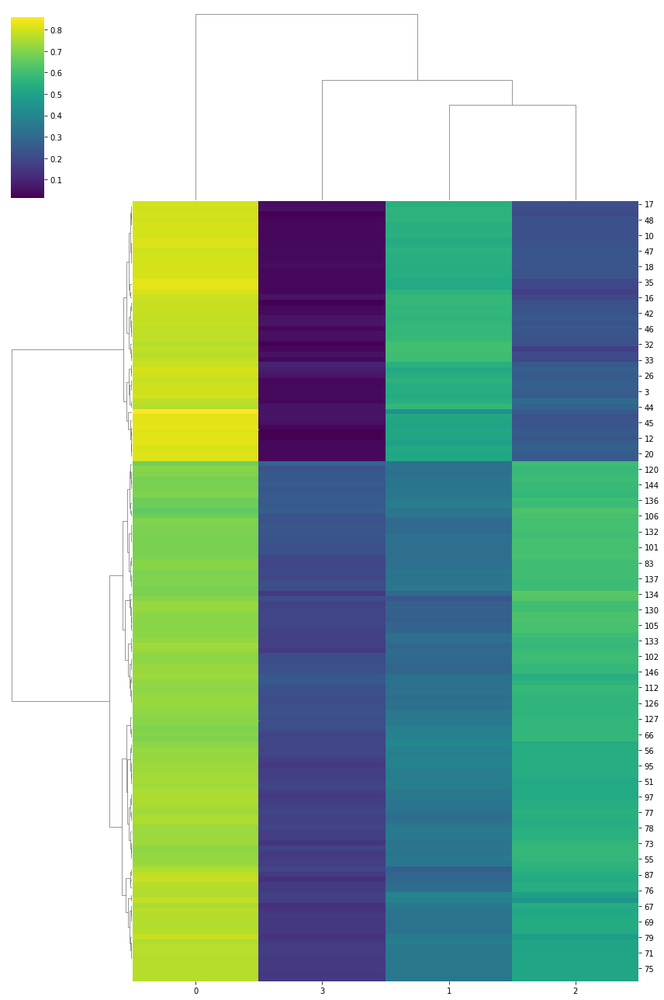

In [28]:
import seaborn as sns

sns.clustermap(normalized_X, figsize=(12,18), method=linkage_type, cmap='viridis')

# Expand figsize to a value like (18, 50) if you want the sample labels to be readable
# Draw back is that you'll need more scrolling to observe the dendrogram

plt.show()

- Looking at the colors of the dimensions can you observe how they differ between the three type of flowers? You should at least be able to notice how one is vastly different from the two others (in the top third of the image)

#### 5. Advantages & Disadvantages of Hierarchical Clustering

##### Advantages
- Resulting hierarchical representation can be very informative
- Provides an additional ability to visualize
- Especially potent when the dataset contains real hierarchical relationships (Eg. Evolutionary Biology)

##### Disadvantages
- Sensitive to noise and outliers
- Computationaly intenive

***************************

# 5. DBSCAN

- DBSCAN stands for density-based spatial clustering of applications with noise
- It grips together points that are closely packed together
- Now, not every point is a part of a cluster. DBSCAN have labeled these points as noise, and this shows us the power of DBSCAN in how it can deal with datasets that have noise

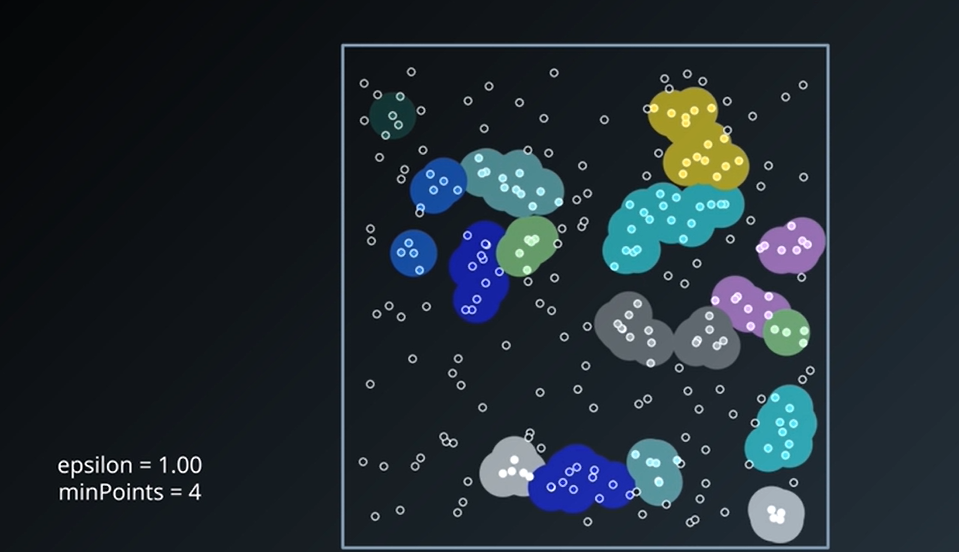

### Step 0:
- Suppose we have two features and we would want to cluster them.

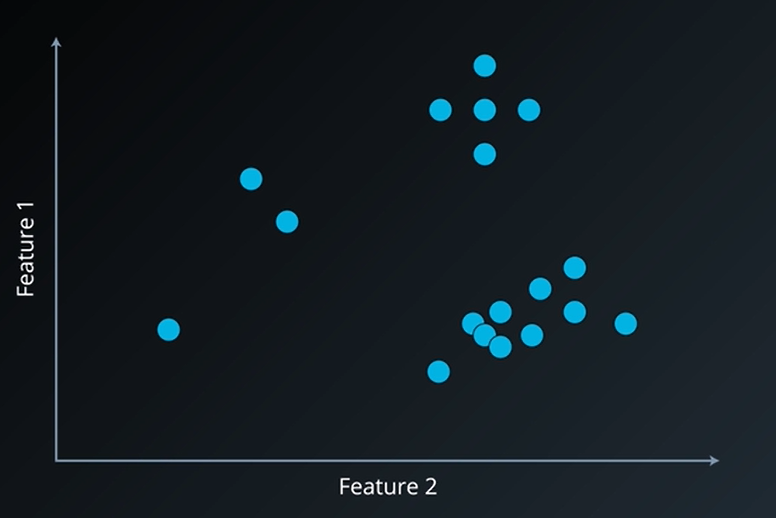

### Step 1:
- DBSCAN starts by arbitrarily selecting a point, we then look in the neighbourhood around it defined by epsilon distance.
- Then, Check if there are any other points in this neighbourhood and turns out there are NONE! So, this point is regarded as a noise point

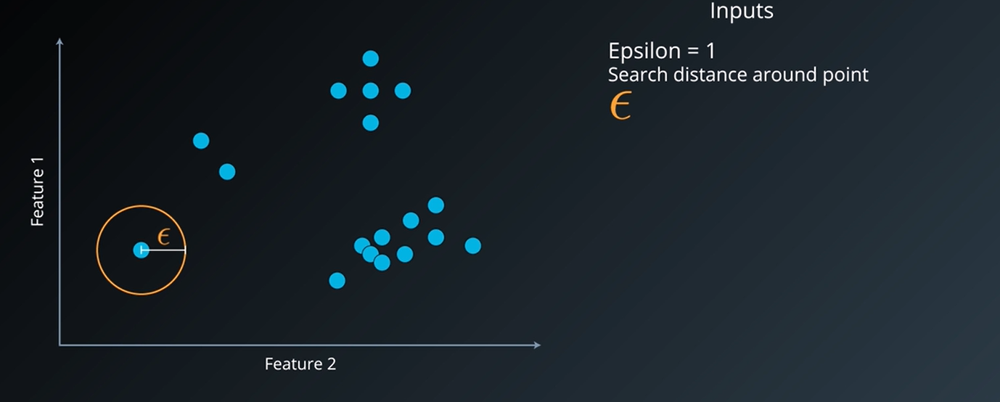

### Step 2:
- Let's take another point and Let's look at its neighbourhood around it defined by epsilon distance.
- Then, Check if there are any other points in this neighbourhood and turns out, there are two points here, including the point that we're looking at.
- Now the question arises, is that enough to classify as a cluster?
- That depends on the another input i.e. minimum number of points. Say we have minimum number of points = 5, but we're only two points, so this point would be regarded as noise.

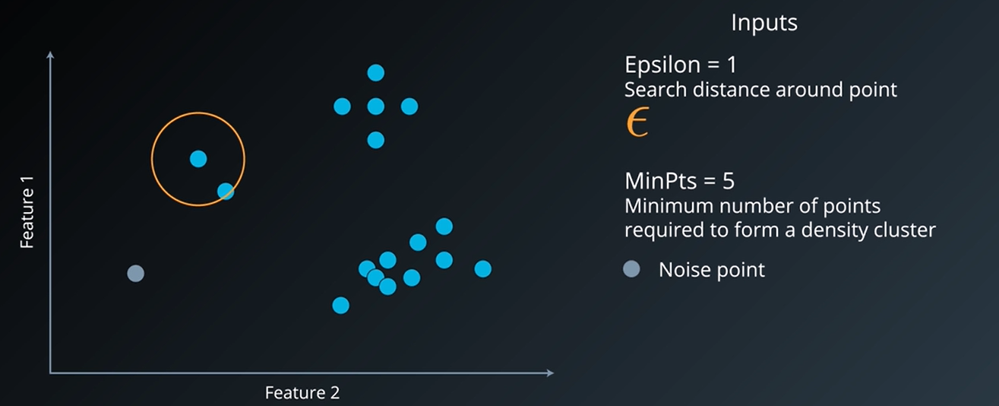

### Step 3:
- Let's take another point and Let's look at its neighbourhood around it defined by epsilon distance.
- Then, Check if there are any other points in this neighbourhood and turns out, there are four points here, including the point that we're looking at.
- Now the question arises, is that enough to classify as a cluster?
- That depends on the another input i.e. minimum number of points. Say we have minimum number of points = 5, but we're only four points, so this point would be regarded as noise. 

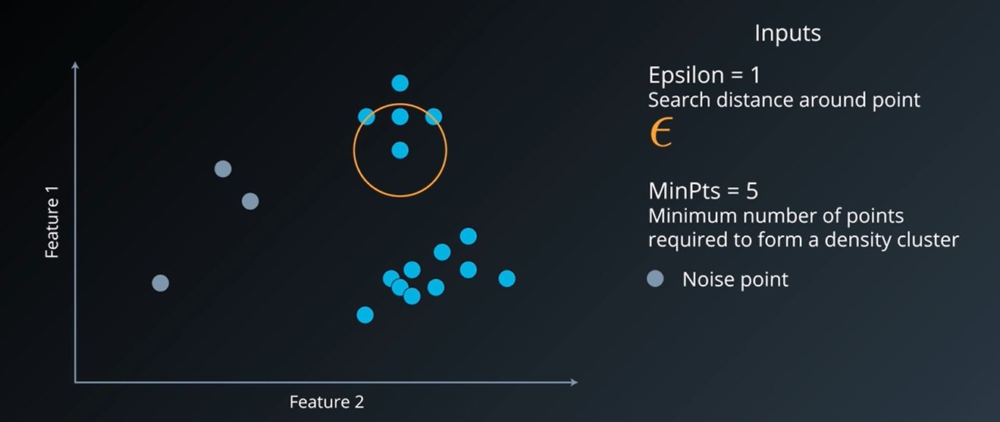

### Step 4:
- Let's take another point and Let's look at its neighbourhood around it defined by epsilon distance.
- Then, Check if there are any other points in this neighbourhood and turns out, there are two points here, including the point that we're looking at.
- Now the question arises, is that enough to classify as a cluster?
- That depends on the another input i.e. minimum number of points. Say we have minimum number of points = 5 and we have five points here
- Hence, We have found our first cluster and that point is called 'Core' point because it has 5 points in its neighbourhood, including the point itself
- Other neighbourhood points (apart from core points) that do not have 5 points in thir neighbourhood are called as border points

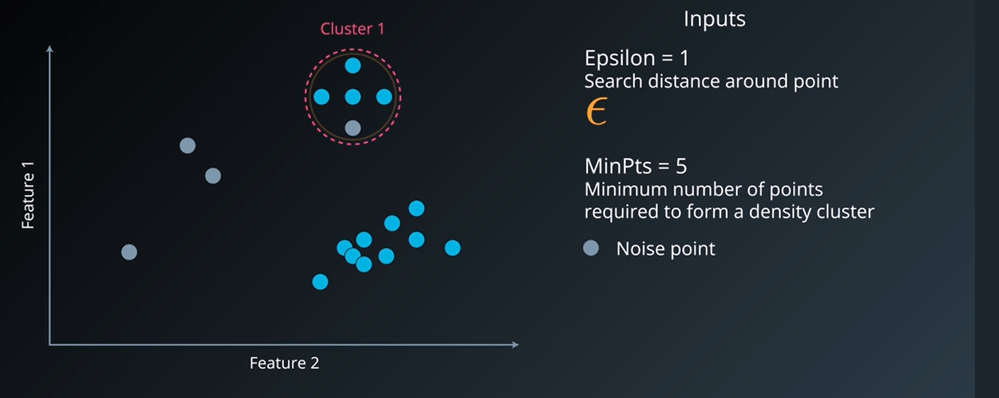

### Step 5:
- Finally, we have

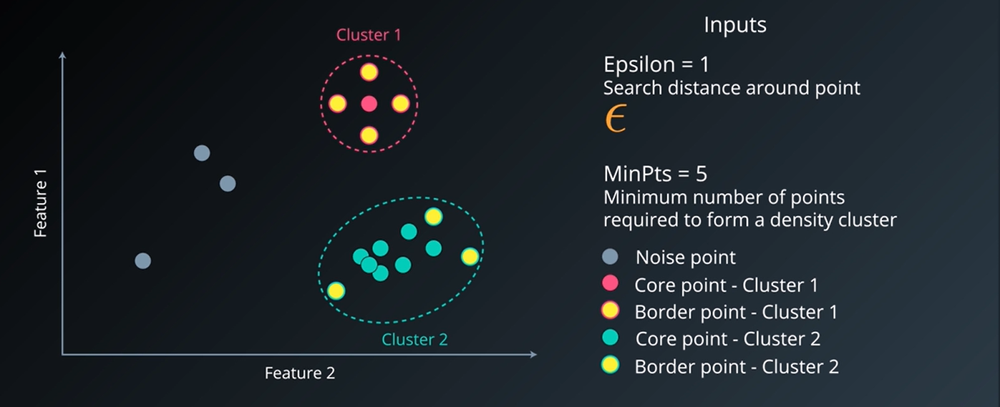

# 6. DBSCAN vs K-Means Clustering

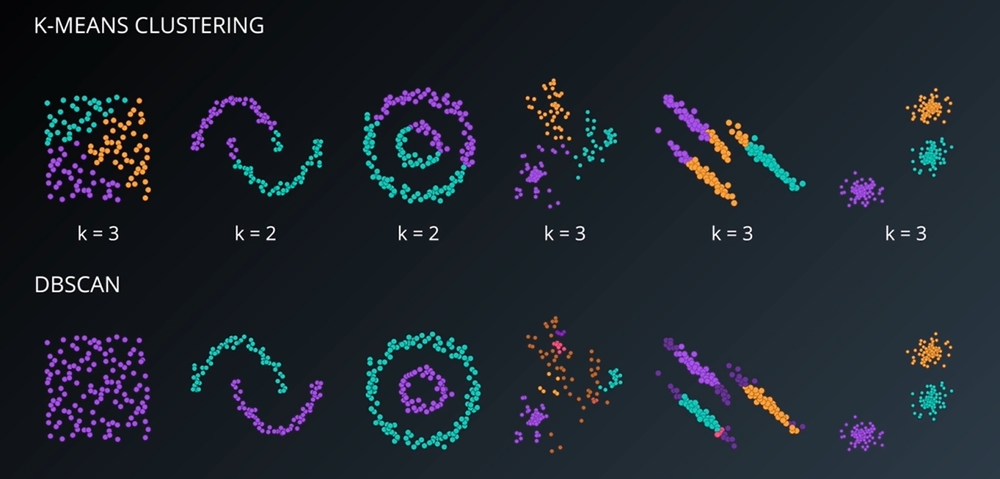

# 7. DBSCAN Implementation

In [29]:
from sklearn import datasets, cluster

In [30]:
# Load dataset
X = datasets.load_iris().data
X

array([[5.1, 3.5, 1.4, 0.2],
       [4.9, 3. , 1.4, 0.2],
       [4.7, 3.2, 1.3, 0.2],
       [4.6, 3.1, 1.5, 0.2],
       [5. , 3.6, 1.4, 0.2],
       [5.4, 3.9, 1.7, 0.4],
       [4.6, 3.4, 1.4, 0.3],
       [5. , 3.4, 1.5, 0.2],
       [4.4, 2.9, 1.4, 0.2],
       [4.9, 3.1, 1.5, 0.1],
       [5.4, 3.7, 1.5, 0.2],
       [4.8, 3.4, 1.6, 0.2],
       [4.8, 3. , 1.4, 0.1],
       [4.3, 3. , 1.1, 0.1],
       [5.8, 4. , 1.2, 0.2],
       [5.7, 4.4, 1.5, 0.4],
       [5.4, 3.9, 1.3, 0.4],
       [5.1, 3.5, 1.4, 0.3],
       [5.7, 3.8, 1.7, 0.3],
       [5.1, 3.8, 1.5, 0.3],
       [5.4, 3.4, 1.7, 0.2],
       [5.1, 3.7, 1.5, 0.4],
       [4.6, 3.6, 1. , 0.2],
       [5.1, 3.3, 1.7, 0.5],
       [4.8, 3.4, 1.9, 0.2],
       [5. , 3. , 1.6, 0.2],
       [5. , 3.4, 1.6, 0.4],
       [5.2, 3.5, 1.5, 0.2],
       [5.2, 3.4, 1.4, 0.2],
       [4.7, 3.2, 1.6, 0.2],
       [4.8, 3.1, 1.6, 0.2],
       [5.4, 3.4, 1.5, 0.4],
       [5.2, 4.1, 1.5, 0.1],
       [5.5, 4.2, 1.4, 0.2],
       [4.9, 3

In [31]:
# Specify the parameters for the clustering. These are the default
db = cluster.DBSCAN(eps = 0.5, min_samples = 5)
db.fit(X)
db.fit_predict(X)

array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,  1,
        1,  1,  1,  1,  1,  1, -1,  1,  1, -1,  1,  1,  1,  1,  1,  1,  1,
       -1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1, -1,  1,  1,  1,  1,  1, -1,  1,  1,  1,  1, -1,  1,  1,  1,
        1,  1,  1, -1, -1,  1, -1, -1,  1,  1,  1,  1,  1,  1,  1, -1, -1,
        1,  1,  1, -1,  1,  1,  1,  1,  1,  1,  1,  1, -1,  1,  1, -1, -1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1],
      dtype=int64)

'db.labels_' now contains an array representing which cluster each point belongs to. Samples labeled '-1' are noise.

# 8. DBSCAN Project

- We will use DBSCAN to cluster a couple of datasests. We will examine how changing its parameters (epsilon and min_samples) changes the resulting cluster structure.

## Dataset 1

In [32]:
import pandas as pd
dataset_1 = pd.read_csv('blobs.csv')[:80].values
dataset_1

array([[ 8.62218539e+00,  1.93579579e+00],
       [-4.73670958e+00, -7.97095765e+00],
       [ 9.62122205e+00,  9.25423147e-01],
       [ 6.16209503e+00, -2.73254368e-01],
       [ 8.69748809e+00, -1.05745206e+00],
       [-4.63572796e+00, -1.13538264e+01],
       [ 6.61651316e+00,  1.14803135e+00],
       [-7.02764163e+00, -1.01346393e+01],
       [ 6.15992460e+00,  1.47702419e+00],
       [ 8.76490767e+00,  1.44356534e-01],
       [-5.15793071e+00, -9.99187862e+00],
       [ 7.21333689e+00,  1.51054570e+00],
       [ 8.25505789e+00,  1.34450147e-01],
       [ 7.37956248e+00,  4.01177074e-01],
       [ 5.94205586e+00,  1.05076833e+01],
       [ 7.88357143e+00,  1.09396951e+01],
       [ 7.82944816e+00,  9.62627158e+00],
       [-5.26628506e+00, -9.90071057e+00],
       [ 7.14461054e+00,  1.12546319e+01],
       [ 6.34681473e+00,  1.03307564e+01],
       [ 4.97085043e+00,  1.69421699e+00],
       [ 7.89167201e+00,  9.35952581e+00],
       [ 8.36186598e+00,  9.08958113e+00],
       [-6.

In [33]:
import matplotlib.pyplot as plt
import numpy as np
from itertools import cycle, islice
from sklearn import cluster

In [34]:
figsize = (10,10)
point_size=150
point_border=0.8

In [35]:
def plot_dataset(dataset, xlim=(-15, 15), ylim=(-15, 15)):
    plt.figure(figsize=figsize)
    plt.scatter(dataset[:,0], dataset[:,1], s=point_size, color="#00B3E9", edgecolor='black', lw=point_border)
    plt.xlim(xlim)
    plt.ylim(ylim)
    plt.show()

In [36]:
def plot_clustered_dataset(dataset, y_pred, xlim=(-15, 15), ylim=(-15, 15), neighborhood=False, epsilon=0.5):

    fig, ax = plt.subplots(figsize=figsize)
    
    colors = np.array(list(islice(cycle(['#df8efd', '#78c465', '#ff8e34',
                                     '#f65e97', '#a65628', '#984ea3',
                                     '#999999', '#e41a1c', '#dede00']),
                              int(max(y_pred) + 1))))
    colors = np.append(colors, '#BECBD6')
    
    
    if neighborhood:
        for point in dataset:
            circle1 = plt.Circle(point, epsilon, color='#666666', fill=False, zorder=0, alpha=0.3)
            ax.add_artist(circle1)

    ax.scatter(dataset[:, 0], dataset[:, 1], s=point_size, color=colors[y_pred], zorder=10, edgecolor='black', lw=point_border)
    plt.xlim(xlim)
    plt.ylim(ylim)
    plt.show()

In [37]:
def plot_dbscan_grid(dataset, eps_values, min_samples_values):
    
    fig = plt.figure(figsize=(16, 20))
    plt.subplots_adjust(left=.02, right=.98, bottom=0.001, top=.96, wspace=.05,
                        hspace=0.25)


    plot_num = 1

    for i, min_samples in enumerate(min_samples_values):
        for j, eps in enumerate(eps_values):
            ax = fig.add_subplot( len(min_samples_values) , len(eps_values), plot_num)

            dbscan = cluster.DBSCAN(eps=eps, min_samples=min_samples)
            y_pred_2 = dbscan.fit_predict(dataset)

            colors = np.array(list(islice(cycle(['#df8efd', '#78c465', '#ff8e34',
                                                 '#f65e97', '#a65628', '#984ea3',
                                                 '#999999', '#e41a1c', '#dede00']),
                                          int(max(y_pred_2) + 1))))
            colors = np.append(colors, '#BECBD6')


            for point in dataset:
                circle1 = plt.Circle(point, eps, color='#666666', fill=False, zorder=0, alpha=0.3)
                ax.add_artist(circle1)

            ax.text(0, -0.03, 'Epsilon: {} \nMin_samples: {}'.format(eps, min_samples), transform=ax.transAxes, fontsize=16, va='top')
            ax.scatter(dataset[:, 0], dataset[:, 1], s=50, color=colors[y_pred_2], zorder=10, edgecolor='black', lw=0.5)


            plt.xticks(())
            plt.yticks(())
            plt.xlim(-14, 5)
            plt.ylim(-12, 7)

            plot_num = plot_num + 1

    plt.show()

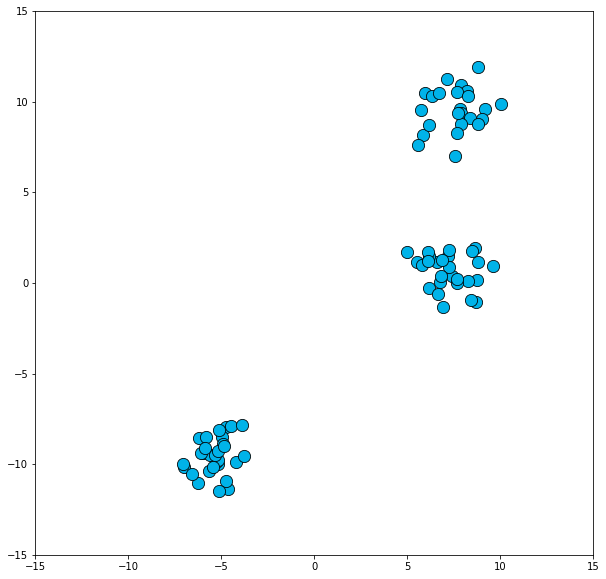

In [38]:
# This our first dataset. It looks like this:
%matplotlib inline
plot_dataset(dataset_1)

In [39]:
# Let's cluster it using DBSCAN's default settings and see what happens.
# We are hoping for it to be able to assign each of the three "blobs" into its own cluster.
# Can it do that out of the box?

# Import sklearn's cluster module
from sklearn import cluster

# Create an instance of DBSCAN
dbscan = cluster.DBSCAN()

# Use DBSCAN's fit_predict to return clustering labels for dataset_1
clustering_labels_1 = dbscan.fit_predict(dataset_1)

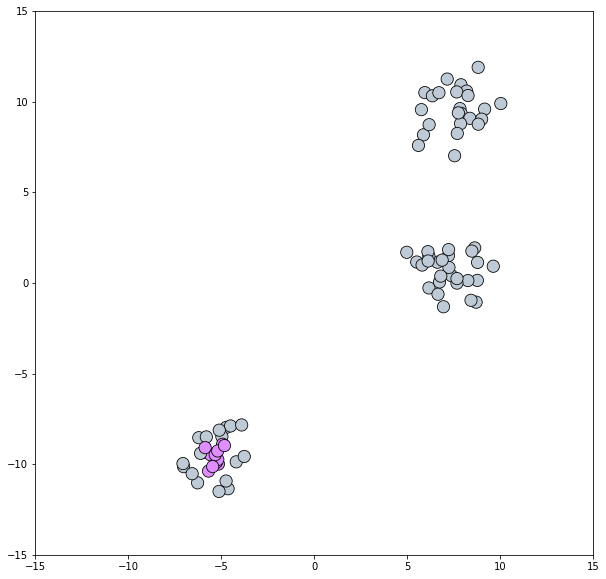

In [40]:
# Plot clustering
plot_clustered_dataset(dataset_1, clustering_labels_1)

- Does that look okay? Was it able to group the dataset into the three clusters we were hoping for?

- As you see, we will have to make some tweaks. Let's start by looking at Epsilon, the radius of each point's neighborhood. The default value in sklearn is 0.5.

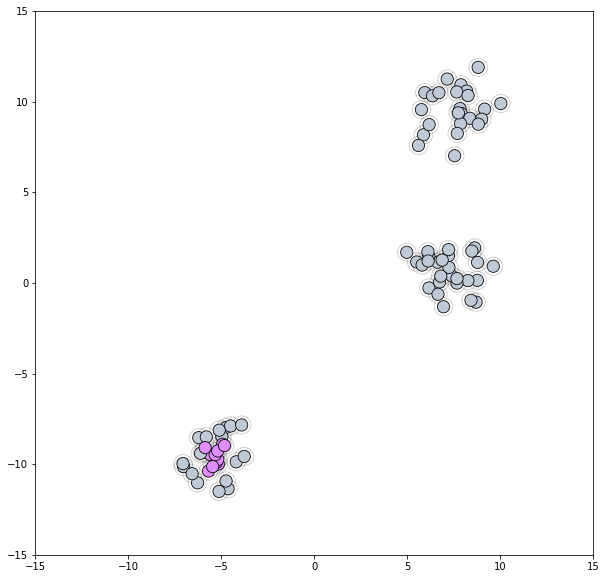

In [41]:
# Plot clustering with neighborhoods
plot_clustered_dataset(dataset_1, clustering_labels_1, neighborhood=True)

- From the graph, we can see that an Epsilon value of 0.5 is too small for this dataset. We need to increase it so the points in a blob overlap each others' neighborhoods, but not to the degree where a single cluster would span two blobs.

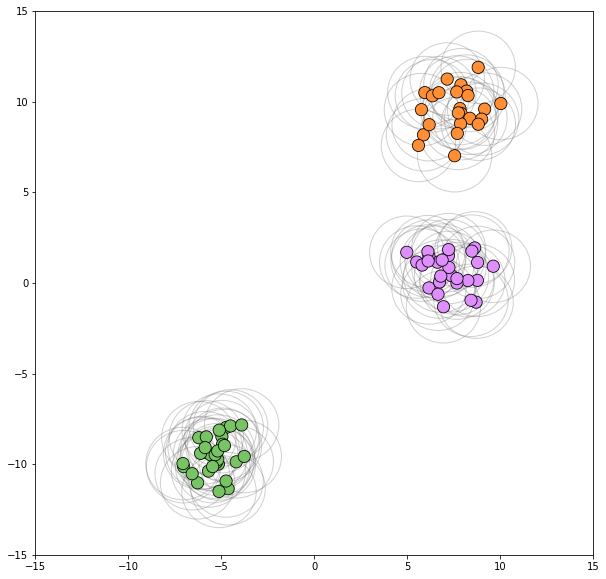

In [42]:
# Increase the value of epsilon to allow DBSCAN to find three clusters in the dataset
epsilon=2

# Cluster
dbscan = cluster.DBSCAN(eps=epsilon)
clustering_labels_2 = dbscan.fit_predict(dataset_1)

# Plot
plot_clustered_dataset(dataset_1, clustering_labels_2, neighborhood=True, epsilon=epsilon)

- As you change the values, you can see that the points cluster into larger clusters and the number of noise points keeps on decreasing.
- Then at Epsilon values above 1.6 we get the clustering we're after.
- But once we increase it to above 5, we start to see two blobs joining together into one cluster.
- So the right Epsilon would be in the range between those values in this scenario.

## Dataset 2

In [43]:
dataset_2 = pd.read_csv('varied.csv')[:300].values
dataset_2

array([[-7.49676990e+00, -4.79577830e+00],
       [-9.87697820e+00, -6.82851017e+00],
       [ 2.20980500e+00,  3.16721279e-01],
       [ 1.82008594e+00,  2.65529109e-01],
       [-9.25601070e+00, -5.95618460e+00],
       [ 1.89767374e+00,  1.06555563e+00],
       [ 1.48000694e+00,  7.62748709e-01],
       [-8.49881910e+00,  2.94532226e-01],
       [-5.23979219e+00, -3.26574921e+00],
       [ 1.50059264e+00,  6.94767441e-01],
       [-8.56483886e+00, -5.24827719e+00],
       [-1.73250493e+00,  1.05477382e+00],
       [-4.14099430e+00,  1.63435186e+00],
       [-1.50263306e+00,  2.65049677e-01],
       [-3.35118658e+00,  1.08535470e+00],
       [-5.12429101e+00,  1.95781017e+00],
       [-9.65768680e+00, -7.54334834e+00],
       [-7.32369129e+00, -4.89060279e+00],
       [-8.71323921e+00, -5.79629478e+00],
       [-3.47825804e+00,  2.22396591e+00],
       [-8.00931901e+00,  1.30868628e+00],
       [-2.83742115e+00, -2.18303805e+00],
       [-8.44047233e+00, -5.18709244e+00],
       [-7.

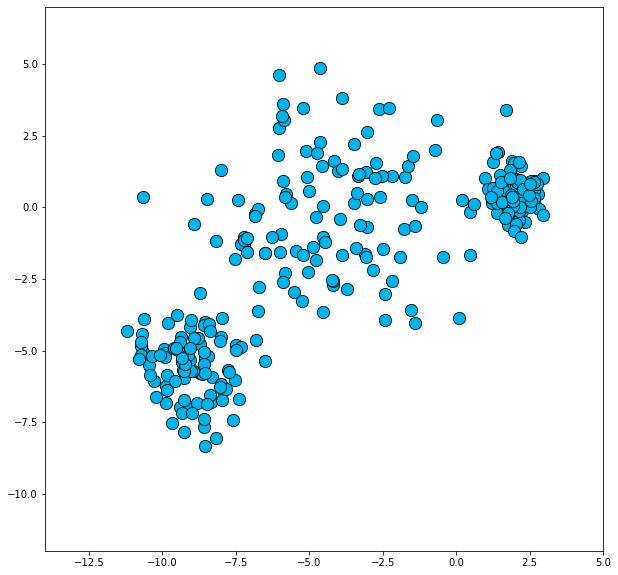

In [44]:
# Plot
plot_dataset(dataset_2, xlim=(-14, 5), ylim=(-12, 7))

- What happens if we run DBSCAN with the default parameter values?

In [45]:
# Cluster with DBSCAN

# Create a new isntance of DBSCAN
dbscan = cluster.DBSCAN()

# Use DBSCAN's fit_predict to return clustering labels for dataset_2
clustering_labels_3 = dbscan.fit_predict(dataset_2)

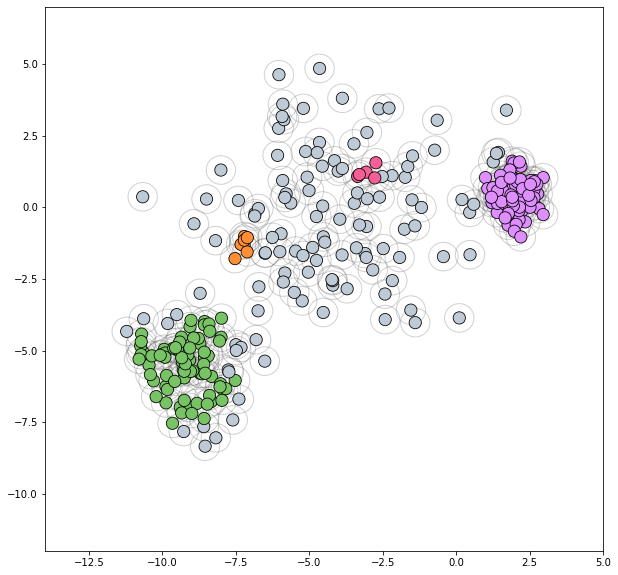

In [46]:
# Plot
plot_clustered_dataset(dataset_2, 
                              clustering_labels_3, 
                              xlim=(-14, 5), 
                              ylim=(-12, 7), 
                              neighborhood=True, 
                              epsilon=0.5)

- This clustering could make sense in some scenarios, but it seems rather arbitrary. Looking at the dataset, we can imagine at least two scenarios for what we'd want to do:
 * **Scenario** 1: Break the dataset up into three clusters: the blob on the left, the blob on the right, and the central area (even though it's less dense than the blobs on either side).
 * **Scenario 2**: Break the dataset up into two clusters: the blob on the left, and the blob on the right. Marking all the points in the center as noise. 

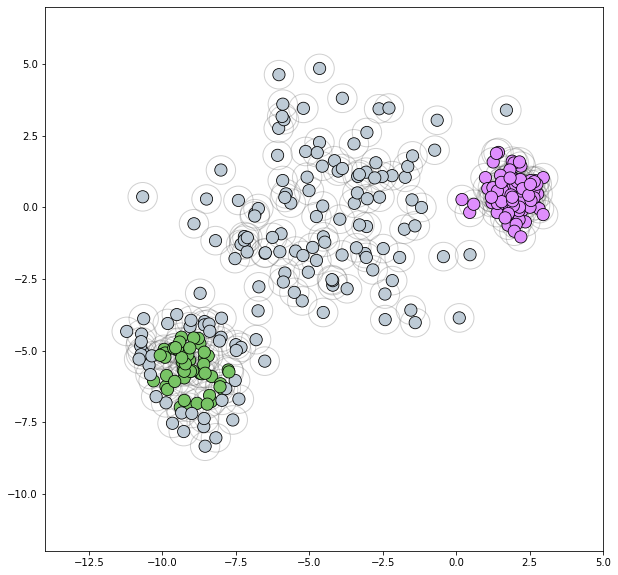

In [47]:
# Experiment with different values for eps and min_samples to find a suitable clustering for the dataset
eps=1.32
min_samples=50

# Cluster with DBSCAN
dbscan = cluster.DBSCAN(eps=eps, min_samples=min_samples)
clustering_labels_4 = dbscan.fit_predict(dataset_2)

# Plot
plot_clustered_dataset(dataset_2, 
                              clustering_labels_4, 
                              xlim=(-14, 5), 
                              ylim=(-12, 7), 
                              neighborhood=True, 
                              epsilon=0.5)

The following grid plots the DBSCAN clustering results of a range of parameter values. Epsilon varies horizontally, while vertically each row shows a different value of min_samples.

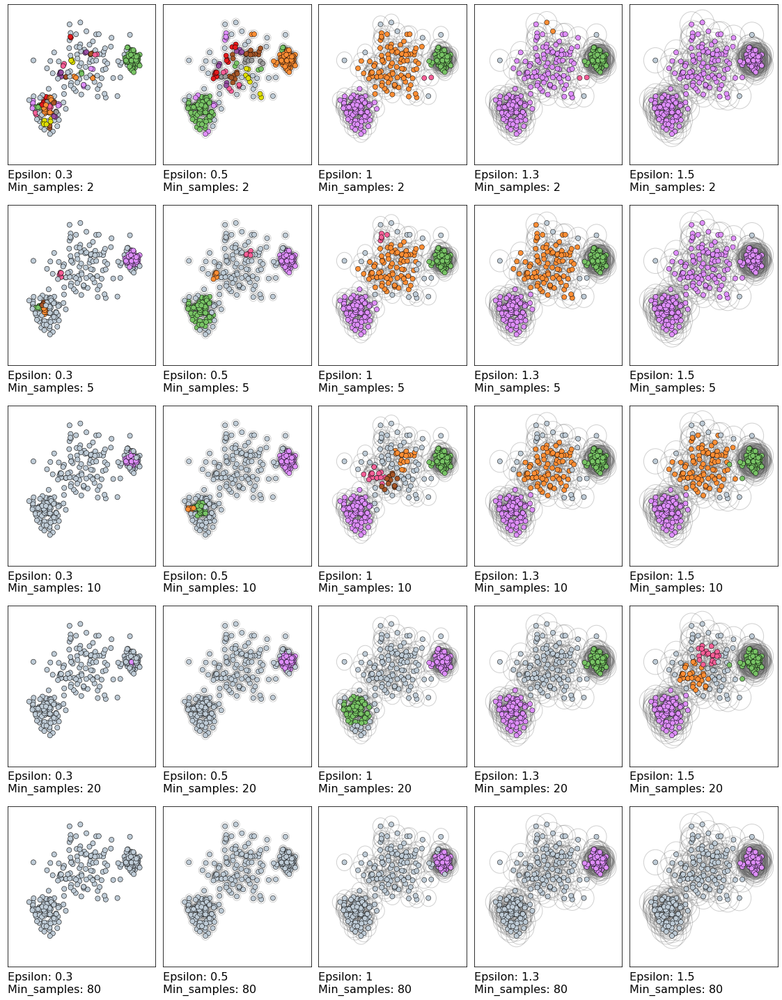

In [48]:
eps_values = [0.3, 0.5, 1, 1.3, 1.5]
min_samples_values = [2, 5, 10, 20, 80]

plot_dbscan_grid(dataset_2, eps_values, min_samples_values)

## Heuristics for experimenting with DBSCAN's parameters
Looking at this grid, we can guess at some general heuristics for tweaking the parameters of DBSCAN:

| |Epsilon too low|Epsilon too high|
|---|---|---|---|
|**min_samples too low** |<img src='low_epsilon_and_low_min_sample.png'><br>Many small clusters. More than anticipated for the dataset. <br>**Action**: increase min_samples and epsilon| <img src='high_epsilon_and_low_min_sample.png'><br>Most points belong to one cluster<br>**Action**: decrease epsilon and increase min_samples|
|**min_samples too high**|<img src='low_epsilon_and_high_min_sample.png'><br>Most/all data points are labeled as noise<br>**Action**: increase epsilon and decrease min_sample| <img src='high_epsilon_and_high_min_sample.png'><br> Except for extremely dense regions, most/all data points are <br>labeled as noise. (Or all points are labeled as noise). <br>**Action**: decrease min_samples and epsilon.|

### Quiz
* Which values do you believe best satisfy scenario 1? 
* Which values do you believe best satisfy scenario 2?

### Answers:
* Epsilon=1.3, min_samples=5 seems to do a good job here. There are other similar ones as well (1,2), for example.
* Epsilon=1.3, min_samples=20 does the best job to satisfy scenario 2 

# 9. Advantages vs Disadvantages of DBSCAN

#### Advantages
- We do not need to specify the number of clusters
- Flexibility in the shapes & sizes of clusters
- Able to deal with noise
- Able to deal with outliers

#### Disadvantages
- Border points that are reachable from clusters
- Faces difficulty finding clusters of varying densities (Use H-DBSCAN instead)